# Unsupervise Analysis of kinase378
## parts: 
### 1. normalization
### 2. UMAP

In [1]:
#!pip install cytominer-eval
import os
import pandas as pd 
import numpy as np
import matplotlib  as mpl
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.max_open_warning': 0})
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

%matplotlib inline
import os, shutil, glob
from PIL import Image
from random import randint
# import re, math
import seaborn as sns; sns.set_style("white")
# from sklearn.manifold import TSNE
import datetime
import gc
from pathlib import Path
from cytominer_eval import evaluate
import scanpy as sc 
from sklearn.decomposition import PCA
import polars as pl

In [2]:
print(os.getcwd())

/share/data/analyses/sofia/kinase378-vt1/CellProfiler/scripts


### set up 

In [3]:
# settings to display more columns and rows
pd.set_option("max_colwidth", 200)
pd.set_option("display.max_columns", 100)
pd.set_option("display.max_rows", 100)

## creating df and merging

In [4]:
# get parquet file
FFI_PARQUET = '/home/jovyan/share/data/analyses/sofia/kinase378-vt1/CellProfiler/ImageMeanFeatures/ImageMeanPlateAllPlates.parquet'
META = '/home/jovyan/share/data/analyses/sofia/kinase378-vt1/data/metadata_improved.csv'

metadata = pd.read_csv(f'{META}', sep=';', index_col=[0])
df = pd.read_parquet(f'{FFI_PARQUET}')
df = df.iloc[:, :-2]
print("features df shape:", df.shape)
display(df.head(2))
print("metadata shape:", metadata.shape)
metadata = metadata.rename(columns = {"cbkid": "compound_id", "well_id" : "well", 'batchid':'batch_id', 'ANNOTATION':'cmpd_name'})
display(metadata.head(2))

features df shape: (49712, 2130)


,ImageID,Metadata_Barcode,Metadata_Well,ImageNumber_nuclei,ObjectNumber_nuclei,Metadata_AcqID,Metadata_Site,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_EulerNumber_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,...,RadialDistribution_ZernikePhase_illumPHAandWGA_4_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_5_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_5_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_9_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_0_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_1_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_2_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_2_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,RadialDistribution_Zerni

metadata shape: (48058, 31)


,layout_id,well,batch_id,solvent,stock_conc,cmpd_vol,well_vol,pert_type,cmpd_conc,cell_line,cells_per_well,batch_id,compound_id,libid,libtxt,smiles,inchi,inkey,Metadata_Barcode,ImageID,plateWell,barcode,size,seeded,plate_type,treatment,painted,compound_name,therapeutic_class_2023,Family,cmpd_name
0,kinase378-v1-plate1-L1,B02,BJ1856070,DMSO,10.0,5.0,40.0,trt,1.25,U2OS,1200.0,BJ1856070,CBK278070,Lib-2049,Selleck_known_kinase_inhibitors,CC(Nc1ccccc1)c1cc(C)cn2c1nc(cc2=O)N1CCOCC1,"InChI=1S/C21H24N4O2/c1-15-12-18(16(2)22-17-6-4-3-5-7-17)21-23-19(13-20(26)25(21)14-15)24-8-10-27-11-9-24/h3-7,12-14,16,22H,8-11H2,1-2H3",CPRAGQJXBLMUEL-UHFFFAOYSA-N,P015230,P015230_B02_1,P015230_B02,P015230,384.0,2022-01-17 14:04:51,BD Falcon 353962,48.0,2022-01-19,NaN,PI3K,NaN,TGX-221
1,kinase378-v1-plate1-L1,B02,BJ1856070,DMSO,10.0,5.0,40.0,trt,1.25,U2OS,1200.0,BJ1856070,CBK278070,Lib-2049,Selleck_known_kinase_inhibitors,CC(Nc1ccccc1)c1cc(C)cn2c1nc(cc2=O)N1CCOCC1,"InChI=1S/C21H24N4O2/c1-15-12-18(16(2)22-17-6-4-3-5-7-17)21-23-19(13-20(26)25(21)14-15)24-8-10-27-11-9-24/h3-7,12-14,16,22H,8-11H2,1-2H3",CPRAGQJXBLMUEL-UHFFFAOYSA-N,P015230,P015230_B02_2,P015230_B02,P015230,384.0,2022-01-17 14:04:51,BD Falcon 353962,48.0,2022-01-19,NaN,PI3K,NaN,TGX-221


In [5]:
df.dropna(inplace=True)
print(df.shape)
df  = df[df['ObjectNumber_nuclei'] >= 5] # drop images that have less than 10 cells
df.shape
df.reset_index(drop=True, inplace=True)
df.head(2)
#add new columns
df['Metadata_Site'] = df['Metadata_Site'].astype(int).astype(str)
df['ImageID'] = df['Metadata_Barcode'] + '_' + df['Metadata_Well'] + '_' + df['Metadata_Site']
df['plateWell'] = df['Metadata_Barcode'] + '_' + df['Metadata_Well']

display(df.tail(2))
df.shape

(48833, 2130)


,ImageID,Metadata_Barcode,Metadata_Well,ImageNumber_nuclei,ObjectNumber_nuclei,Metadata_AcqID,Metadata_Site,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_EulerNumber_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,...,RadialDistribution_ZernikePhase_illumPHAandWGA_5_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_5_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_9_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_0_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_1_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_2_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_2_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_4_cytoplasm,RadialDistribution_ZernikePha

(48235, 2131)

In [6]:
df_merged = pd.merge(df, metadata, how='left',left_on=['Metadata_Barcode','ImageID'], right_on=['Metadata_Barcode', 'ImageID' ])

In [7]:
df = df_merged.copy()

# already done in the previous cell
#df.rename(columns={'batchid_x':'batchid', 'cbkid_x':'cbkid', 'plateWell_y':'plateWell'}, inplace=True)

In [42]:
# df.dropna(subset = ['compound'], inplace=True)
# df.reset_index(drop=True, inplace=True)
# df.tail(3)

In [43]:
#df.compound_id.unique()

In [8]:
df.dropna(subset = ['compound_id'], inplace=True)
df.reset_index(drop=True, inplace=True)
df.tail()

,ImageID,Metadata_Barcode,Metadata_Well,ImageNumber_nuclei,ObjectNumber_nuclei,Metadata_AcqID,Metadata_Site,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_EulerNumber_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,...,RadialDistribution_ZernikePhase_illumSYTO_4_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_5_cytoplasm,plateWell_x,layout_id,well,batch_id,solvent,stock_conc,cmpd_vol,well_vol,pert_type,cmpd_conc,cell_line,cells_per_well,batch_id,compound_id,libid,libtxt,smiles,inchi,inkey,plateWell_y,barcode,size,seeded,plate_type,treatment,painted,compound_name,therapeutic_class_2023,Family,cmpd_name
45329,P015249_O23_5,P015249,O23,1.0,62.0,1542.0,5,1192.065041,1723.081301,1176.707317,1165.804878,1135.593496,1124.902439,1155.812256,1144.952271,1.375233,1287.382114,0.703623,38.149323,1.121951,0.710346,0.807938,47.827572,47.266277,15.200496,5.952336,5.361162,31.982321,32.226852,-4.912338,134.727951,0.940031,0.675655,0.052137,0.146418,0.080805,0.018710,0.014459,0.029268,0.019399,0.021148,0.013736,0.012277,0.007881,0.011124,0.014429,0.010368,0.008530,0.008237,0.007718,...,0.010822,-0.194856,-0.012018,0.153312,0.070757,-0.187664,0.033046,0.227037,0.149535,0.133585,-0.159603,-0.077856,0.212270,-0.024758,0.115779,0.180931,0.140046,-0.389217,0.197391,-0.233132,P015249_O23,kinase378-v1-plate3-L6,O23,BJ1856310,DMSO,10.0,5.0,40.0,trt,1.25,HOG,1200.0,BJ1856310,CBK293863,Lib-2049,Selleck_known_kinase_inhibitors,COc1cc(ccc1Nc1ncc(Cl)c(n1)-c1c[nH]c2ccccc12)N1CCC(N)CC1,"InChI=1S/C24H25ClN6O/c1-32-22-12-16(31-10-8-15(26)9-11-31)6-7-21(22)29-24-28-14-19(25)23(30-24)18-13-27-20-5-3-2-4-17(18)20/h2-7,12-15,27H,8-11,26H2,1H3,(H,28,29,30)",GCYIGMXOIWJGBU-UHFFFAOYSA-N,P015249_O23,P015249,384.0,2022-03-08 11:39:37,BD Falcon 353962,48.0,2022-03-10,NaN,NaN,Alk,AZD3463
45330,P015249_O23_6,P015249

In [9]:
CompoundList = sorted(list(set(df['compound_id'].astype(str))))
print(len(CompoundList))
print(CompoundList[-7:])
PlateList = sorted(list(set(df['Metadata_Barcode'])))
print(PlateList)
CelllineList = sorted(list(set(df['cell_line'])))
print(CelllineList)
print(len(CelllineList))
#set(df['cell_line']) #check what is in this column?

383
['CBK293913C', '[berb]', '[dmso]', '[etop]', '[fenb]', '[flup]', '[tetr]']
['P015230', 'P015231', 'P015232', 'P015233', 'P015234', 'P015235', 'P015236', 'P015237', 'P015238', 'P015239', 'P015240', 'P015242', 'P015244', 'P015245', 'P015246', 'P015247', 'P015248', 'P015249']
['A549', 'HOG', 'U2OS']
3


In [10]:
QC = '/home/jovyan/share/data/analyses/sofia/kinase378-vt1/data/Flags.csv'
QC = pd.read_csv(f'{QC}', sep=';', index_col=[0])
QC.dtypes
QC['Metadata_Site'] = QC['Metadata_Site'].astype(str)
QC['Total'].value_counts()

Total
0    48751
1     1145
Name: count, dtype: int64

In [11]:
# merging and dropping
df_merged = df.merge(QC, left_on = ['Metadata_Barcode', 'Metadata_Well', 'Metadata_Site', 'cell_line'] , right_on = ['Metadata_Barcode', 'Metadata_Well', 'Metadata_Site', 'cell_line'] , how = 'left')
print("df_merged", df_merged.shape)
df_merged = df_merged[df_merged['Total'] == 0 ]
print("df_merged:", df_merged.shape)

df_merged (45334, 2163)
df_merged: (44642, 2163)


In [48]:
#df_merged.to_csv('/home/jovyan/share/data/analyses/sofia/kinase378-vt1/data/df_merged.csv', sep=';', index=False)

## df_merged can be used from this point on

In [12]:
ControlCompounds = CompoundList[-6:]
display(ControlCompounds)
ControlCompounds = ['[dmso]', '[berb]',  '[etop]', '[fenb]', '[flup]', '[tetr]']
display(ControlCompounds)


['[berb]', '[dmso]', '[etop]', '[fenb]', '[flup]', '[tetr]']

['[dmso]', '[berb]', '[etop]', '[fenb]', '[flup]', '[tetr]']

In [13]:
# # CREATING A DATAFRAME FOR EACH CELL LINE and saving them in a csv file :)
# print(list(set(df_merged['cell_line'])))
# df_HOG = df_merged[df_merged['cell_line'] == 'HOG']
# df_HOG.reset_index(drop=True, inplace=True)
# print(df_HOG.shape)
#df_HOG.to_csv('/home/jovyan/share/data/analyses/sofia/kinase378-vt1/CellProfiler/HOG/df_HOG.csv', sep=';', index=False)
df_U2OS= df_merged[df_merged['cell_line'] == 'U2OS']
df_U2OS.reset_index(drop=True, inplace=True)
print(df_U2OS.shape)
#df_U2OS.to_csv('/home/jovyan/share/data/analyses/sofia/kinase378-vt1/CellProfiler/U2OS/df_U2OS.csv', sep=';', index=False)

# df_A549= df_merged[df_merged['cell_line'] == 'A549']
# df_A549.reset_index(drop=True, inplace=True)
# print(df_A549.shape)
# df_A549.to_csv('/home/jovyan/share/data/analyses/sofia/kinase378-vt1/CellProfiler/A549/df_A549.csv', sep=';', index=False)


(15423, 2163)


In [14]:
df_U2OS.head(1)

,ImageID,Metadata_Barcode,Metadata_Well,ImageNumber_nuclei,ObjectNumber_nuclei,Metadata_AcqID,Metadata_Site,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_EulerNumber_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,...,RadialDistribution_ZernikePhase_illumSYTO_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_5_cytoplasm,plateWell_x,layout_id,well,batch_id,solvent,stock_conc,cmpd_vol,well_vol,pert_type,cmpd_conc,cell_line,cells_per_well,batch_id,compound_id,libid,libtxt,smiles,inchi,inkey,plateWell_y,barcode,size,seeded,plate_type,treatment,painted,compound_name,therapeutic_class_2023,Family,cmpd_name,Count_nuclei,cell_line_plate,Total
0,P015230_B02_1,P015230,B02,1.0,42.0,1362.0,1,2131.795181,2931.445783,960.638554,1125.457831,907.457831,1072.060241,933.689453,1098.178223,1.260955,2202.638554,0.717754,50.479679,1.0,0.73145,0.804235,63.141754,62.866806,20.120483,7.80568,7.041424,41.041996,41.450008,8.326373,176.673447,0.96503,0.655136,0.044279,0.153259,0.079043,0.018,0.015624,0.029609,0.020195,0.023385,0.013351,0.01221,0.007129,0.010855,0.015658,0.009367,0.01002,0.007887,0.007845,...,-0.167023,0.211002,-0.023631,0.205681,-0.007268,-0.174204,0.15258,0.372422,-0.147382,-0.164113,0.234112,-0.307315,0.062425,-0.249644,0.057171,0.026649,-0.112131,P015230_B02,kinase378-v1-plate1-L1,B02,BJ1856070,DMSO,10.0,5.0,40.0,trt,1.25,U2OS,1200.0,BJ1856070,CBK278070,Lib-2049,Selleck_known_kinase_inhibitors,CC(Nc1ccccc1)c1cc(C)cn2c1nc(cc2=O)N1CCOCC1,"InChI=1S/C21H24N4O2/c1-15-12-18(16(2)22-17-6-4-3-5-7-17)21-23-19(13-20(26)25(21)14-15)24-8-10-27-11-9-24/h3-7,12-14,16,22H,8-11H2,1-2H3",CPRAGQJXBLMUEL-UHFFFAOYSA-N,P015230_B02,P015230,384.0,2022-01-17 14:04:51,BD Falcon 353962,48.0,2022-01-19,NaN,PI3K,NaN,TGX-221,72,U2OS_P015230,0


In [73]:
df_U2OS.compound_id.unique()

array(['CBK278070', 'CBK278013', 'CBK041209', 'CBK290556', 'CBK149343H',
       'CBK278042', '[tetr]', 'CBK288259', 'CBK290660', 'CBK277966',
       'CBK290567', 'CBK290480', 'CBK176259G', '[dmso]', 'CBK290589',
       'CBK293852', 'CBK290585', 'CBK277936', 'CBK277931', 'CBK278049',
       '[fenb]', 'CBK288288', 'CBK288312', 'CBK288299', 'CBK288286G',
       'CBK288287', 'CBK290253', 'CBK041232C', 'CBK288297', 'CBK277993',
       'CBK288261', 'CBK277967', 'CBK278088', 'CBK290527N', 'CBK277977',
       'CBK290484', 'CBK288271', '[berb]', 'CBK277923', 'CBK278001',
       'CBK278000H', 'CBK288328', 'CBK278121G', 'CBK277998', 'CBK288278',
       'CBK288289', 'CBK169041', 'CBK288318', 'CBK041168', 'CBK278119G',
       '[flup]', 'CBK016914', 'CBK277985', 'CBK277951', 'CBK201014C',
       'CBK277995', 'CBK290482', 'CBK288272', 'CBK288253C', 'CBK040864',
       'CBK278044', 'CBK288298', 'CBK201383', 'CBK290339', 'CBK277956',
       'CBK288283', 'CBK290490', 'CBK277940', 'CBK041801', 'CBK288257

In [15]:
df_U2OS.Metadata_Barcode.unique()

array(['P015230', 'P015236', 'P015244', 'P015231', 'P015237', 'P015245'],
      dtype=object)

In [16]:
from unsupervised import * 
X, varying_features = numeric_columns(df_U2OS, df_merged)
U2OS_varying_features = varying_features
U2OS_varying_features = U2OS_varying_features[:-6]
U2OS_varying_features

Head of numeric columns:
   ImageNumber_nuclei  ObjectNumber_nuclei  Metadata_AcqID  \
0                 1.0                 42.0          1362.0   
1                 1.0                 43.5          1362.0   
2                 1.0                 74.0          1362.0   
3                 1.0                 50.5          1362.0   
4                 1.0                 47.0          1362.0   

   AreaShape_Area_nuclei  AreaShape_BoundingBoxArea_nuclei  \
0            2131.795181                       2931.445783   
1            2142.441860                       3018.011628   
2            2278.931973                       3178.394558   
3            2338.490000                       3238.780000   
4            2268.139785                       3196.752688   

   AreaShape_BoundingBoxMaximum_X_nuclei  \
0                             960.638554   
1                            1010.279070   
2                            1063.979592   
3                            1083.560000   
4        

['AreaShape_Area_nuclei',
 'AreaShape_BoundingBoxArea_nuclei',
 'AreaShape_BoundingBoxMaximum_X_nuclei',
 'AreaShape_BoundingBoxMaximum_Y_nuclei',
 'AreaShape_BoundingBoxMinimum_X_nuclei',
 'AreaShape_BoundingBoxMinimum_Y_nuclei',
 'AreaShape_Center_X_nuclei',
 'AreaShape_Center_Y_nuclei',
 'AreaShape_Compactness_nuclei',
 'AreaShape_ConvexArea_nuclei',
 'AreaShape_Eccentricity_nuclei',
 'AreaShape_EquivalentDiameter_nuclei',
 'AreaShape_Extent_nuclei',
 'AreaShape_FormFactor_nuclei',
 'AreaShape_MajorAxisLength_nuclei',
 'AreaShape_MaxFeretDiameter_nuclei',
 'AreaShape_MaximumRadius_nuclei',
 'AreaShape_MeanRadius_nuclei',
 'AreaShape_MedianRadius_nuclei',
 'AreaShape_MinFeretDiameter_nuclei',
 'AreaShape_MinorAxisLength_nuclei',
 'AreaShape_Orientation_nuclei',
 'AreaShape_Perimeter_nuclei',
 'AreaShape_Solidity_nuclei',
 'AreaShape_Zernike_0_0_nuclei',
 'AreaShape_Zernike_1_1_nuclei',
 'AreaShape_Zernike_2_0_nuclei',
 'AreaShape_Zernike_2_2_nuclei',
 'AreaShape_Zernike_3_1_nuclei',


In [17]:
## calculate mediad values for DMSO -- standarization
dfDMSO = df_U2OS[df_U2OS['compound_id'] == '[dmso]']  # Calculate median values for DMSO
dfDMSO_Medians = dfDMSO[U2OS_varying_features].median()

In [18]:
dfDMSO_Medians


AreaShape_Area_nuclei                                      2276.585866
AreaShape_BoundingBoxArea_nuclei                           3194.039911
AreaShape_BoundingBoxMaximum_X_nuclei                      1101.791007
AreaShape_BoundingBoxMaximum_Y_nuclei                      1105.606777
AreaShape_BoundingBoxMinimum_X_nuclei                      1045.117137
                                                              ...     
RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm      -0.006245
RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm       0.005996
RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm       0.000510
RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm      -0.323020
RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm      -0.012571
Length: 2015, dtype: float64

In [19]:
dfDMSO_MADs = (dfDMSO[U2OS_varying_features] - dfDMSO[U2OS_varying_features].median()).abs().median() # Calculate median absolute deviations for DMSO

In [20]:
print(len(U2OS_varying_features))
U2OS_varying_in_DMSO = dfDMSO_MADs.loc[dfDMSO_MADs > 0.0001].index # Remove features that are invariant or close to invariant in DMSO
len(U2OS_varying_in_DMSO)

2015


1728

In [21]:
U2OS_varying_in_DMSO

Index(['AreaShape_Area_nuclei', 'AreaShape_BoundingBoxArea_nuclei',
       'AreaShape_BoundingBoxMaximum_X_nuclei',
       'AreaShape_BoundingBoxMaximum_Y_nuclei',
       'AreaShape_BoundingBoxMinimum_X_nuclei',
       'AreaShape_BoundingBoxMinimum_Y_nuclei', 'AreaShape_Center_X_nuclei',
       'AreaShape_Center_Y_nuclei', 'AreaShape_Compactness_nuclei',
       'AreaShape_ConvexArea_nuclei',
       ...
       'RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm',
       'RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm',
       'RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm',
       'RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm',
       'RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm',
       'RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm',
       'RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm',
       'RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm',
       'RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm',


In [22]:
df_U2OS.head(1)

,ImageID,Metadata_Barcode,Metadata_Well,ImageNumber_nuclei,ObjectNumber_nuclei,Metadata_AcqID,Metadata_Site,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_EulerNumber_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,...,RadialDistribution_ZernikePhase_illumSYTO_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_5_cytoplasm,plateWell_x,layout_id,well,batch_id,solvent,stock_conc,cmpd_vol,well_vol,pert_type,cmpd_conc,cell_line,cells_per_well,batch_id,compound_id,libid,libtxt,smiles,inchi,inkey,plateWell_y,barcode,size,seeded,plate_type,treatment,painted,compound_name,therapeutic_class_2023,Family,cmpd_name,Count_nuclei,cell_line_plate,Total
0,P015230_B02_1,P015230,B02,1.0,42.0,1362.0,1,2131.795181,2931.445783,960.638554,1125.457831,907.457831,1072.060241,933.689453,1098.178223,1.260955,2202.638554,0.717754,50.479679,1.0,0.73145,0.804235,63.141754,62.866806,20.120483,7.80568,7.041424,41.041996,41.450008,8.326373,176.673447,0.96503,0.655136,0.044279,0.153259,0.079043,0.018,0.015624,0.029609,0.020195,0.023385,0.013351,0.01221,0.007129,0.010855,0.015658,0.009367,0.01002,0.007887,0.007845,...,-0.167023,0.211002,-0.023631,0.205681,-0.007268,-0.174204,0.15258,0.372422,-0.147382,-0.164113,0.234112,-0.307315,0.062425,-0.249644,0.057171,0.026649,-0.112131,P015230_B02,kinase378-v1-plate1-L1,B02,BJ1856070,DMSO,10.0,5.0,40.0,trt,1.25,U2OS,1200.0,BJ1856070,CBK278070,Lib-2049,Selleck_known_kinase_inhibitors,CC(Nc1ccccc1)c1cc(C)cn2c1nc(cc2=O)N1CCOCC1,"InChI=1S/C21H24N4O2/c1-15-12-18(16(2)22-17-6-4-3-5-7-17)21-23-19(13-20(26)25(21)14-15)24-8-10-27-11-9-24/h3-7,12-14,16,22H,8-11H2,1-2H3",CPRAGQJXBLMUEL-UHFFFAOYSA-N,P015230_B02,P015230,384.0,2022-01-17 14:04:51,BD Falcon 353962,48.0,2022-01-19,NaN,PI3K,NaN,TGX-221,72,U2OS_P015230,0


In [23]:
len(df_U2OS.therapeutic_class_2023.unique())

83

In [24]:
import pandas as pd

# Assuming df_U2OS, dfDMSO_Medians, and dfDMSO_MADs are already loaded and structured correctly.

# Get unique plate barcodes from the dataset.
plates = df_U2OS.Metadata_Barcode.unique()

# Create an empty list to store z-score DataFrames for each plate.
zscore_dfs = []

for plate in plates:
    # Filter the data for each plate.
    df_plate = df_U2OS[df_U2OS['Metadata_Barcode'] == plate]
    
    # Calculate the z-scores for the columns specified in U2OS_varying_in_DMSO.
    df_plate_zscores = (df_plate[U2OS_varying_in_DMSO] - dfDMSO_Medians[U2OS_varying_in_DMSO]) / dfDMSO_MADs[U2OS_varying_in_DMSO]
    
    # Add the metadata columns back to the z-score DataFrame.
    df_plate_zscores = pd.concat([df_plate_zscores, df_plate[['Metadata_Barcode',  
                                                               'Metadata_Well', 
                                                               'Metadata_Site', 
                                                               'Count_nuclei',
                                                               'compound_id',
                                                               'cmpd_conc',
                                                               'cmpd_name',  
                                                               'Family',
                                                               'therapeutic_class_2023',
                                                               'ImageID']]], axis=1)
    
    # Add ReplicateGroup and Replicate columns.
    df_plate_zscores['ReplicateGroup'] = df_plate_zscores['compound_id'] + '_' + df_plate_zscores['cmpd_conc'].astype(str) 
    df_plate_zscores['Replicate'] = df_plate_zscores['ReplicateGroup'] + '_' + df_plate_zscores['ImageID']
    
    # Append the processed DataFrame for this plate to the list.
    zscore_dfs.append(df_plate_zscores)

# Concatenate all plate-specific z-score DataFrames into a single DataFrame.
U2OS_dfZscores = pd.concat(zscore_dfs, axis=0).reset_index(drop=True)

# Display the first few rows of the final z-score DataFrame.
U2OS_dfZscores.head(5)

,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,AreaShape_Zernike_7_5_nuclei,AreaShape_Zernike_7_7_nuclei,AreaShape_Zernike_8_0_nuclei,AreaShape_Zernike_8_2_nuclei,AreaShape_Zernike_8_4_nuclei,AreaShape_Zernike_8_6_nuclei,AreaShape_Zernike_8_8_nuclei,AreaShape_Zernike_9_1_nuclei,...,RadialDistribution_ZernikePhase_illumPHAandWGA_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_9_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_1_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_2_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,Metadata_Barcode,Metadata_Well,Metadata_Site,Count_nuclei,compound_id,cmpd_conc,cmpd_name,Family,therapeutic_class_2023,ImageID,ReplicateGroup,Replicate
0,-2.299470,-3.014067,-2.172426,0.277843,-2.128036,0.334498,-2.141344,0.301081,-1.084642,-2.440732,-2.379966,-3.105904,3.419789,1.4

In [27]:
#this z-scores are calculated for each plate separately and then mereged into one dataframe
U2OS_dfZscores.to_csv('/home/jovyan/share/data/analyses/sofia/kinase378-vt1/CellProfiler/U2OS/U2OS_dfZscores.csv', sep=';', index=False)

In [25]:
display(zscore_dfs)

[      AreaShape_Area_nuclei  AreaShape_BoundingBoxArea_nuclei  \
 0                 -2.299470                         -3.014067   
 1                 -2.130386                         -2.020460   
 2                  0.037259                         -0.179578   
 3                  0.983120                          0.513529   
 4                 -0.134135                          0.031137   
 ...                     ...                               ...   
 2580              -0.222757                         -0.302303   
 2581               2.296571                          2.917535   
 2582               1.250578                          1.500013   
 2583               4.069312                          5.146297   
 2584               3.694135                          4.559514   
 
       AreaShape_BoundingBoxMaximum_X_nuclei  \
 0                                 -2.172426   
 1                                 -1.408427   
 2                                 -0.581942   
 3            

In [62]:
# calculate z-scores for all plates separately
# U2OS_dfZscores = df_U2OS[U2OS_varying_in_DMSO].copy()  # Calculate z-scores
# U2OS_dfZscores = (df_U2OS[U2OS_varying_in_DMSO] - dfDMSO_Medians[U2OS_varying_in_DMSO])/dfDMSO_MADs[U2OS_varying_in_DMSO].copy()
# U2OS_dfZscores = pd.concat([U2OS_dfZscores, df_U2OS[['Metadata_Barcode',  
#                                         'Metadata_Well', 
#                                         'Metadata_Site', 
#                                         'Count_nuclei',
#                                         'compound_id',
#                                         'cmpd_conc',
#                                         'cmpd_name',  
#                                         'Family',
#                                         'therapeutic_class_2023',
#                                         'ImageID',
#                                ]]], axis = 1) 
# U2OS_dfZscores = U2OS_dfZscores.copy()

# U2OS_dfZscores['ReplicateGroup'] = U2OS_dfZscores['compound_id'] + '_' + U2OS_dfZscores['cmpd_conc'].astype(str) 
# U2OS_dfZscores['Replicate'] = U2OS_dfZscores['ReplicateGroup'] + '_' + U2OS_dfZscores['ImageID']
# U2OS_dfZscores.head(5)

In [26]:
U2OS_dfZscores.shape

(15423, 1740)

### gritscore

In [28]:
features = list(U2OS_dfZscores[U2OS_varying_in_DMSO])

meta_features = list(U2OS_dfZscores.columns[-12:])
print(meta_features)
control_perts = U2OS_dfZscores.query("compound_id == '[dmso]'").Replicate.unique().tolist() # This makes a list of wells that contain DMSO
print(len(control_perts))

['Metadata_Barcode', 'Metadata_Well', 'Metadata_Site', 'Count_nuclei', 'compound_id', 'cmpd_conc', 'cmpd_name', 'Family', 'therapeutic_class_2023', 'ImageID', 'ReplicateGroup', 'Replicate']
1080


In [29]:
grit_replicate_groups = {
    "profile_col": "Replicate", 
     "replicate_group_col": "ReplicateGroup" 
}

In [30]:
U2OS_dfZscores.Metadata_Barcode.unique()

array(['P015230', 'P015236', 'P015244', 'P015231', 'P015237', 'P015245'],
      dtype=object)

In [67]:
#U2OS_dfZscores.to_csv('/home/jovyan/share/data/analyses/sofia/kinase378-vt1/CellProfiler/U2OS/U2OS_dfZscores.csv', sep=';', index=False)

## trying polars

In [68]:
#pl_df_U2OS = pl.read_csv('/home/jovyan/share/data/analyses/sofia/kinase378-vt1/CellProfiler/U2OS/df_U2OS.csv', separator=';')

In [69]:
#pl_U2OS_dfZscores = pl.read_csv('/home/jovyan/share/data/analyses/sofia/kinase378-vt1/CellProfiler/U2OS/U2OS_dfZscores.csv', separator=';')

In [70]:
#pl_U2OS_dfZscores.head(2)

AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,…,RadialDistribution_ZernikePhase_illumPHAandWGA_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_9_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_1_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_2_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,Metadata_Barcode,Metadata_Well,Metadata_Site,Count_nuclei,compound_id,cmpd_conc,cmpd_name,Family,therapeutic_class_2023,ImageID,ReplicateGroup,Replicate
f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,…,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,str,str,i64,i64,str,f64,str,str,str,str,str,str
-2.29947,-3.014067,-2.172426,0.277843,-2.128036,0.334498,-2.141344,0.301081,-1.084642,-2.440732,-2.379966,-3.105904,3.419789,1.409809,-3.616612,-3.586692,-2.380383,-2.367971,-2.469808,-2.261501,-2.138484,2.600797,-3.426927,0.250735,2.154894,0.412182,-3.361616,-2.597642,0.640108,3.210318,1.034626,-3.042582,-2.636867,2.951523,4.616306,2.103271,-1.269891,…,-0.03968,-1.038929,-1.334986,-0.783438,2.544261,-1.508306,0.428798,-0.435208,-1.027644,-0.952181,-0.456903,-3.562558,0.870366,2.533657,-1.599006,-0.623598,-0.276632,1.910473,-0.081527,-1.438954,1.531471,3.510973,-1.442287,1.467833,2.25341,"""P015230""","""B02""",1,72,"""CBK278070""",1.25,"""TGX-221""",null,"""PI3K""","""P015230_B02_1""","""CBK278070_1.25""","""CBK278070_1.25_P015230_B02_1"""
-2.130386,-2.02046,-1.408427,3.361864,-1.361818,3.432657,-1.384602,3.39071,0.884645,-2.274142,0.768993,-3.895485,-4.09786,-0.476056,-2.837345,-2.691735,-3.805155,-3.649859,-3.525347,-4.310502,-4.369034,0.873438,-3.667768,-6.207711,-3.261196,-3.656118,-0.4

In [31]:
grit_scores = []

for one_plate in U2OS_dfZscores.Metadata_Barcode.unique():
    one_plate_df = U2OS_dfZscores.query("Metadata_Barcode == @one_plate")
    
    grit_results = evaluate(
        profiles=one_plate_df,
        features=features,
        meta_features=meta_features,
        replicate_groups=grit_replicate_groups,
        operation="grit",
        similarity_metric="pearson",
        grit_replicate_summary_method="mean", # median
        grit_control_perts=control_perts
        ).assign(one_plate=one_plate)
    grit_results = grit_results.merge(one_plate_df[['Count_nuclei', 'Replicate' ]], left_on = 'perturbation', right_on = 'Replicate')
    grit_scores.append(grit_results)

In [32]:
OutputDir = '/home/jovyan/share/data/analyses/sofia/kinase378-vt1/CellProfiler/U2OS'
Cellline='U2OS'
grit_scores_df = pd.concat(grit_scores).reset_index(drop=True)
#print("Before", grit_scores_df.shape)
grit_scores_df['compound'] = grit_scores_df.perturbation.str.split('_').str[0]
grit_scores_df['dose'] = grit_scores_df.perturbation.str.split('_').str[1].astype(float)
grit_scores_df.to_csv('{}/GritScores_{}.csv'.format(OutputDir, Cellline), sep=';')
#print("After", grit_scores_df.shape)
#grit_scores.head()
grit_scores_df.head(9)

,perturbation,group,grit,one_plate,Count_nuclei,Replicate,compound,dose
0,CBK016914_1.25_P015230_D16_1,CBK016914_1.25,0.892721,P015230,179,CBK016914_1.25_P015230_D16_1,CBK016914,1.25
1,CBK016914_1.25_P015230_D16_2,CBK016914_1.25,1.222578,P015230,178,CBK016914_1.25_P015230_D16_2,CBK016914,1.25
2,CBK016914_1.25_P015230_D16_3,CBK016914_1.25,0.770798,P015230,150,CBK016914_1.25_P015230_D16_3,CBK016914,1.25
3,CBK016914_1.25_P015230_D16_4,CBK016914_1.25,0.706781,P015230,225,CBK016914_1.25_P015230_D16_4,CBK016914,1.25
4,CBK016914_1.25_P015230_D16_5,CBK016914_1.25,0.931409,P015230,169,CBK016914_1.25_P015230_D16_5,CBK016914,1.25
5,CBK016914_1.25_P015230_D16_6,CBK016914_1.25,0.338027,P015230,226,CBK016914_1.25_P015230_D16_6,CBK016914,1.25
6,CBK016914_1.25_P015230_D16_7,CBK016914_1.25,0.749637,P015230,184,CBK016914_1.25_P015230_D16_7,CBK016914,1.25
7,CBK016914_1.25_P015230_D16_8,CBK016914_1.25,0.490313,P015230,217,CBK016914_1.25_P015230_D16_8,CBK016914,1.25
8,CBK016914_1.25_P015230_D16_9,CBK016914_1.25,0.688854,P015230,250,CBK016914_1.25_P015230_D16_9,CBK016914,1.25


In [33]:
grit_scores_df.columns

Index(['perturbation', 'group', 'grit', 'one_plate', 'Count_nuclei',
       'Replicate', 'compound', 'dose'],
      dtype='object')

In [34]:
grit_scores_grouped = grit_scores_df.groupby('group').mean(numeric_only=True).reset_index()
# Split 'group' column to get 'compound' and 'dose'
grit_scores_grouped[['compound', 'dose']] = grit_scores_grouped['group'].str.split('_', expand=True)

# Convert 'dose' column to float
grit_scores_grouped['dose'] = grit_scores_grouped['dose'].astype(float)
#grit_scores_grouped['compound'] = grit_scores_grouped.index.str.split('_').str[0]
# grit_scores_grouped['doses'] = grit_scores_grouped.index.str.split('_').str[1].astype(float)

grit_scores_grouped.sort_values(by=['compound','dose'], inplace=True)
grit_scores_grouped.to_csv('{}/GritScoresGrouped_{}.csv'.format(OutputDir, Cellline), sep=';')


In [35]:
grit_scores_grouped = grit_scores_df.groupby('group').mean(numeric_only=True)

grit_scores_grouped['compound'] = grit_scores_grouped.index.str.split('_').str[0]
grit_scores_grouped['dose'] = grit_scores_grouped.index.str.split('_').str[1].astype(float)

grit_scores_grouped.sort_values(by=['compound','dose'], inplace=True)
#grit_scores_grouped.to_csv('{}/GritScoresGrouped_{}.csv'.format(OutputDir, Cellline), sep=';')

In [37]:
grit_scores_grouped

,grit,Count_nuclei,dose,compound
group,,,,
CBK013405_1.25,7.837377e-01,154.277778,1.25,CBK013405
CBK013405_5.0,1.221137e+00,128.611111,5.00,CBK013405
CBK016914_1.25,7.999311e-01,177.500000,1.25,CBK016914
CBK016914_5.0,1.405317e+00,169.388889,5.00,CBK016914
CBK040864_1.25,7.846133e-01,158.166667,1.25,CBK040864
...,...,...,...,...
[dmso]_0.05,1.601416e-18,164.718519,0.05,[dmso]
[etop]_2.5,4.190743e+00,58.143519,2.50,[etop]
[fenb]_2.5,4.325850e+00,77.685446,2.50,[fenb]


In [38]:
grit_scores_grouped.head(10) # with Median/Mad

,grit,Count_nuclei,dose,compound
group,,,,
CBK013405_1.25,0.783738,154.277778,1.25,CBK013405
CBK013405_5.0,1.221137,128.611111,5.00,CBK013405
CBK016914_1.25,0.799931,177.500000,1.25,CBK016914
CBK016914_5.0,1.405317,169.388889,5.00,CBK016914
CBK040864_1.25,0.784613,158.166667,1.25,CBK040864
CBK040864_5.0,1.162747,143.055556,5.00,CBK040864
CBK040892_1.25,1.602231,147.388889,1.25,CBK040892
CBK040892_5.0,2.718484,110.000000,5.00,CBK040892
CBK040896_1.25,0.483958,154.388889,1.25,CBK040896


In [40]:
# Print rows with NaN values in the 'grit' column
nan_rows = grit_scores_grouped[grit_scores_grouped['grit'].isna()]

# Display the rows with NaN values
print(nan_rows)

                grit  Count_nuclei  dose   compound
group                                              
CBK290821_1.25   NaN          33.0  1.25  CBK290821
CBK290821_5.0    NaN          29.0  5.00  CBK290821


In [41]:
df_grits_clean = grit_scores_grouped.drop(['Count_nuclei', 'dose', 'compound'], axis=1, errors='ignore')


In [42]:
# Select the column that contains the grit scores
grit_column = 'grit'  # replace 'grit' with the actual column name in your dataframe

# Ensure all values in the grit column are numeric, forcing errors to NaN
grits_numeric = pd.to_numeric(df_grits_clean[grit_column], errors='coerce')

# Remove NaN values (if you want to exclude them)
grits_cleaned = grits_numeric.dropna()

# Now you can safely sort
grits_sorted = np.sort(grits_cleaned)

# Print the number of unique grits scores
print("Number of unique grits scores:", len(np.unique(grits_sorted)))

Number of unique grits scores: 752


In [45]:
grits = df_grits_clean
grits = np.sort(grits)
print("Number of unique grits scores:", len(grits))
#print("Nan in grits:", np.count_nonzero(~np.isnan(grits)))
grit_below_1 = (grits < 0.99).sum()
grit_below_1
df_grit_1 = grit_scores_grouped[grit_scores_grouped['grit'] >= 0.99 ]
# df.sort_values(by=['col1'])
df_grit_1 = df_grit_1.sort_values(by=['grit'],)
df_grit_1
print("Number of low grits scores:", len(df_grit_1))


df_grit_1_5 = grit_scores_grouped[grit_scores_grouped['grit'] >= 1.5 ]
# df.sort_values(by=['col1'])
df_grit_1_5 = df_grit_1_5.sort_values(by=['grit'],)
df_grit_1_5
print("Number of low grits scores higher than 1.5:", len(df_grit_1_5))

df_grit_4 = grit_scores_grouped[grit_scores_grouped['grit'] >= 4]
# df.sort_values(by=['col1'])
df_grit_4 = df_grit_4.sort_values(by=['grit'],)
df_grit_4
print("Number of low grits scores higher than 4:", len(df_grit_4))

Number of unique grits scores: 754
Number of low grits scores: 521
Number of low grits scores higher than 1.5: 341
Number of low grits scores higher than 4: 104


In [46]:
df_grit_1

,grit,Count_nuclei,dose,compound
group,,,,
CBK277971C_5.0,0.990108,158.833333,5.00,CBK277971C
CBK277948_5.0,0.990276,188.882353,5.00,CBK277948
CBK290689_1.25,0.992404,183.777778,1.25,CBK290689
CBK288313_1.25,0.992856,154.611111,1.25,CBK288313
CBK041223_5.0,0.993980,135.111111,5.00,CBK041223
...,...,...,...,...
CBK288278_5.0,5.944757,56.722222,5.00,CBK288278
CBK277956_5.0,6.291641,84.111111,5.00,CBK277956
CBK288341_1.25,6.373289,110.500000,1.25,CBK288341


/tmp/ipykernel_83954/2058109511.py:22: FutureWarning: 

The `errcolor` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'color': 'gray'}` instead.

  sns.barplot(
/tmp/ipykernel_83954/2058109511.py:22: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 2}` instead.

  sns.barplot(


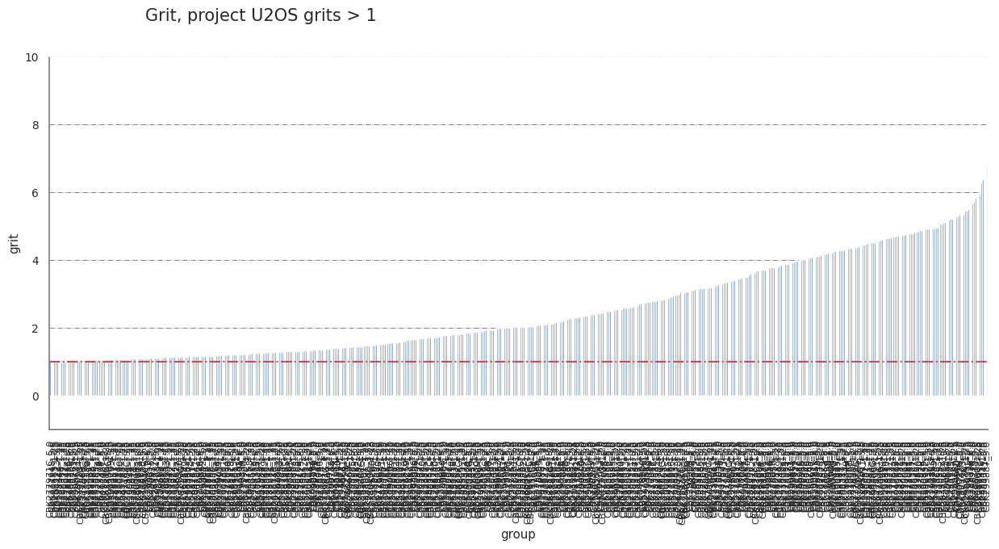

In [47]:
import matplotlib.pyplot as plt
import seaborn as sns
project = 'U2OS grits > 1'

# Initialize the figure and set its size
fig = plt.figure(figsize=(15, 6))

# Set Seaborn style and font size
sns.set(font_scale=0.9)

# Add a super title for the figure
fig.suptitle(
    f'Grit, project {project}',
    fontsize=15,
    x=0.3
)

# Define subplot layout (1 row, 1 column)
ax = fig.add_subplot(1, 1, 1)

# Create a bar plot
sns.barplot(
    x="group",
    y="grit",
    data=df_grit_1,
    alpha=1,
    errcolor='gray',
    errwidth=2,
    ax=ax
)

# Customize plot appearance
ax.set_facecolor('w')
ax.spines['bottom'].set_color('grey')
ax.spines['left'].set_color('grey')
ax.set_ylim([-1, 10])  # Set y-axis limits
ax.yaxis.grid(which="major", color='grey', linestyle='-.', linewidth=0.7)
plt.axhline(y=1, color='r', linestyle='-.')  # Add a horizontal reference line
ax.tick_params(axis='x', which='major', labelsize=8, rotation=90)  # Customize x-axis tick labels

# Display the plot
# Define the filename
#ilename = "grit_barplot_{}".format(project)

plt.show()

In [62]:
# df_grit_4.tail(10)

,grit,Count_nuclei,dose,compound
group,,,,
CBK288336_5.0,5.612516,26.000000,5.00,CBK288336
CBK277936_5.0,5.661877,55.444444,5.00,CBK277936
CBK290215_5.0,5.751140,103.444444,5.00,CBK290215
CBK288314_5.0,5.828913,69.611111,5.00,CBK288314
CBK290806G_1.25,5.920556,30.714286,1.25,CBK290806G
CBK288278_5.0,5.946536,56.722222,5.00,CBK288278
CBK277956_5.0,6.294774,84.111111,5.00,CBK277956
CBK288341_1.25,6.377814,110.500000,1.25,CBK288341
CBK288341_5.0,6.437666,82.388889,5.00,CBK288341


In [48]:
import scanpy as sc
# Load the features data
features_df = U2OS_dfZscores

# Separate feature data and metadata
num_metadata_cols = 12
feature_data_df = features_df.iloc[:, :-num_metadata_cols]  # All columns except the last 11
metadata_df = features_df.iloc[:, -num_metadata_cols:]      # Last 11 columns (metadata)

# Ensure that metadata has the same row indices as feature data
if not feature_data_df.index.equals(metadata_df.index):
    raise ValueError("The indices of feature data and metadata do not match.")

import scanpy as sc

# Create AnnData object with feature data
adata = sc.AnnData(X=feature_data_df,obs=metadata_df)

print(adata)


AnnData object with n_obs × n_vars = 15423 × 1728
    obs: 'Metadata_Barcode', 'Metadata_Well', 'Metadata_Site', 'Count_nuclei', 'compound_id', 'cmpd_conc', 'cmpd_name', 'Family', 'therapeutic_class_2023', 'ImageID', 'ReplicateGroup', 'Replicate'


/usr/local/lib/python3.10/dist-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [49]:
adata
print(adata.obs.head())  # Print the first few rows of metadata

  Metadata_Barcode Metadata_Well Metadata_Site  Count_nuclei compound_id  \
0          P015230           B02             1            72   CBK278070   
1          P015230           B02             2            78   CBK278070   
2          P015230           B02             3           137   CBK278070   
3          P015230           B02             4            93   CBK278070   
4          P015230           B02             5            82   CBK278070   

   cmpd_conc cmpd_name Family therapeutic_class_2023        ImageID  \
0       1.25   TGX-221    NaN                   PI3K  P015230_B02_1   
1       1.25   TGX-221    NaN                   PI3K  P015230_B02_2   
2       1.25   TGX-221    NaN                   PI3K  P015230_B02_3   
3       1.25   TGX-221    NaN                   PI3K  P015230_B02_4   
4       1.25   TGX-221    NaN                   PI3K  P015230_B02_5   

   ReplicateGroup                     Replicate  
0  CBK278070_1.25  CBK278070_1.25_P015230_B02_1  
1  CBK278070_1.2

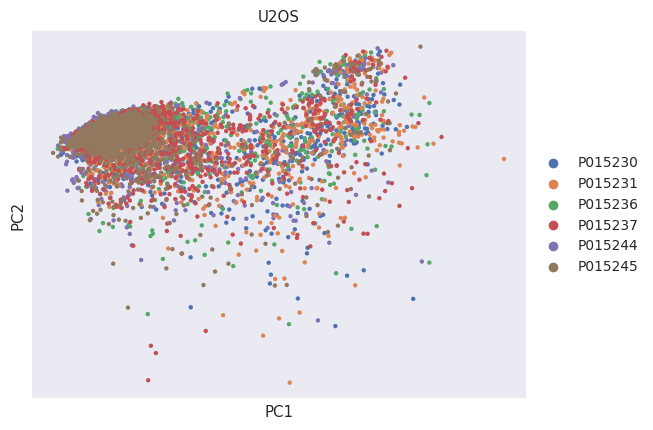

In [50]:
#Compute PCA
sc.tl.pca(adata)
sc.pl.pca(
    adata,
    color='Metadata_Barcode',                  # Replace with actual metadata column name
    title='U2OS',         # Plot title
    size=40,                          # Size of points)

)

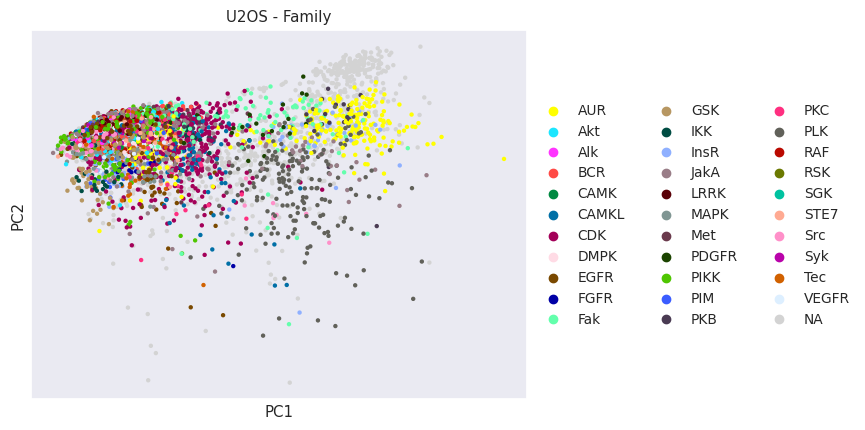

In [51]:
#Compute PCA
sc.tl.pca(adata)
sc.pl.pca(
    adata,
    color='Family',                  # Replace with actual metadata column name
    title='U2OS - Family',         # Plot title
    size=40,                          # Size of points)

)

/usr/local/lib/python3.10/dist-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


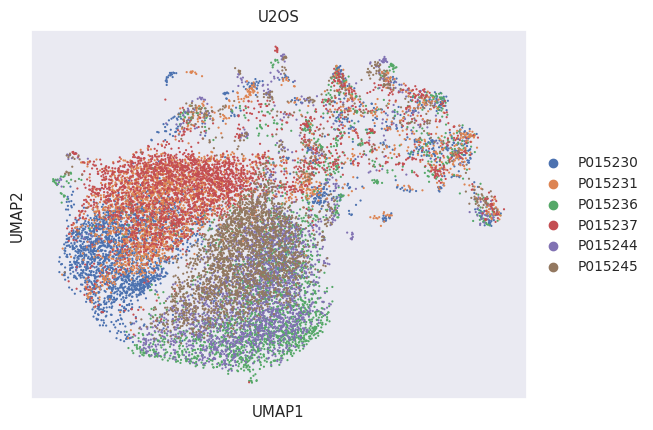

In [52]:
# Compute UMAP
sc.pp.neighbors(adata)  # This computes the neighborhood graph
sc.tl.umap(adata)       # This computes the UMAP coordinates

# Set the figure size
#plt.figure(figsize=(30, 20))  # Adjust the size if needed
sc.tl.umap(adata)
#fig, ax = plt.subplots(figsize=(8, 8))
sc.pl.umap(
    adata,
    #color='Metadata_Barcode',                  # Replace with actual metadata column name
    color='Metadata_Barcode',                  # Replace with actual metadata column name
    title='U2OS',         # Plot title
    size=10,                          # Size of points)

)

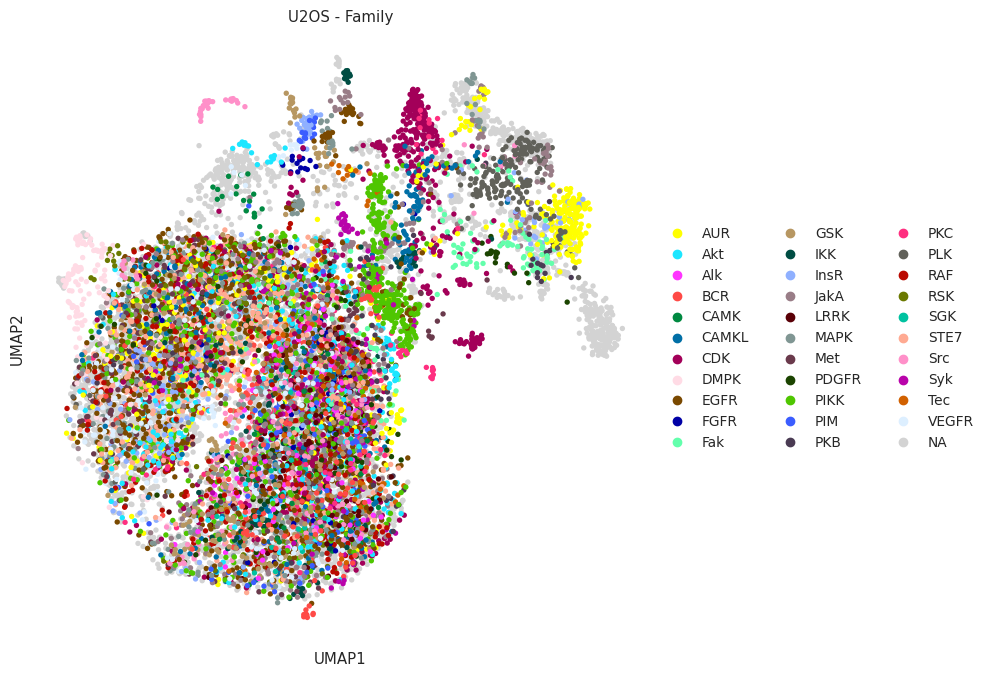

In [57]:
# Compute UMAP
sc.pp.neighbors(adata)  # This computes the neighborhood graph
sc.tl.umap(adata)       # This computes the UMAP coordinates

# Set the figure size
#plt.figure(figsize=(30, 20))  # Adjust the size if needed
sc.tl.umap(adata)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_facecolor('white')  # Set background color to light gray (or any color you prefer)

sc.pl.umap(
    adata,
    #color='Metadata_Barcode',                  # Replace with actual metadata column name
    color='Family',                  # Replace with actual metadata column name
    title='U2OS - Family',         # Plot title
    ax=ax,
    size=60,                          # Size of points)
)

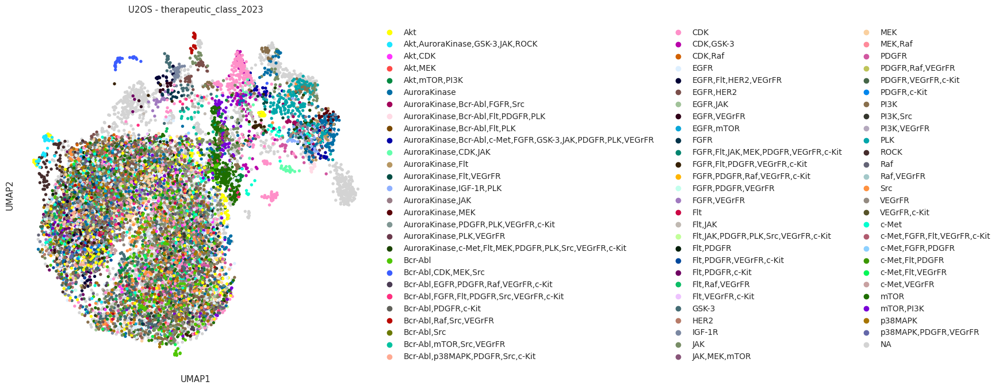

In [59]:
# Compute UMAP
sc.pp.neighbors(adata)  # This computes the neighborhood graph
sc.tl.umap(adata)       # This computes the UMAP coordinates

# Set the figure size
#plt.figure(figsize=(30, 20))  # Adjust the size if needed
sc.tl.umap(adata)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_facecolor('white')  # Set background color to light gray (or any color you prefer)

sc.pl.umap(
    adata,
    #color='Metadata_Barcode',                  # Replace with actual metadata column name
    color='therapeutic_class_2023',                  # Replace with actual metadata column name
    title='U2OS - therapeutic_class_2023',         # Plot title
    ax=ax,
    size=60,                          # Size of points)
)

In [86]:
#sc.pl.clustermap(adata,cmap='RdBu_r',figsize=(20, 20), cbar_pos=(0.05, 0.2, 0.03, 0.1))

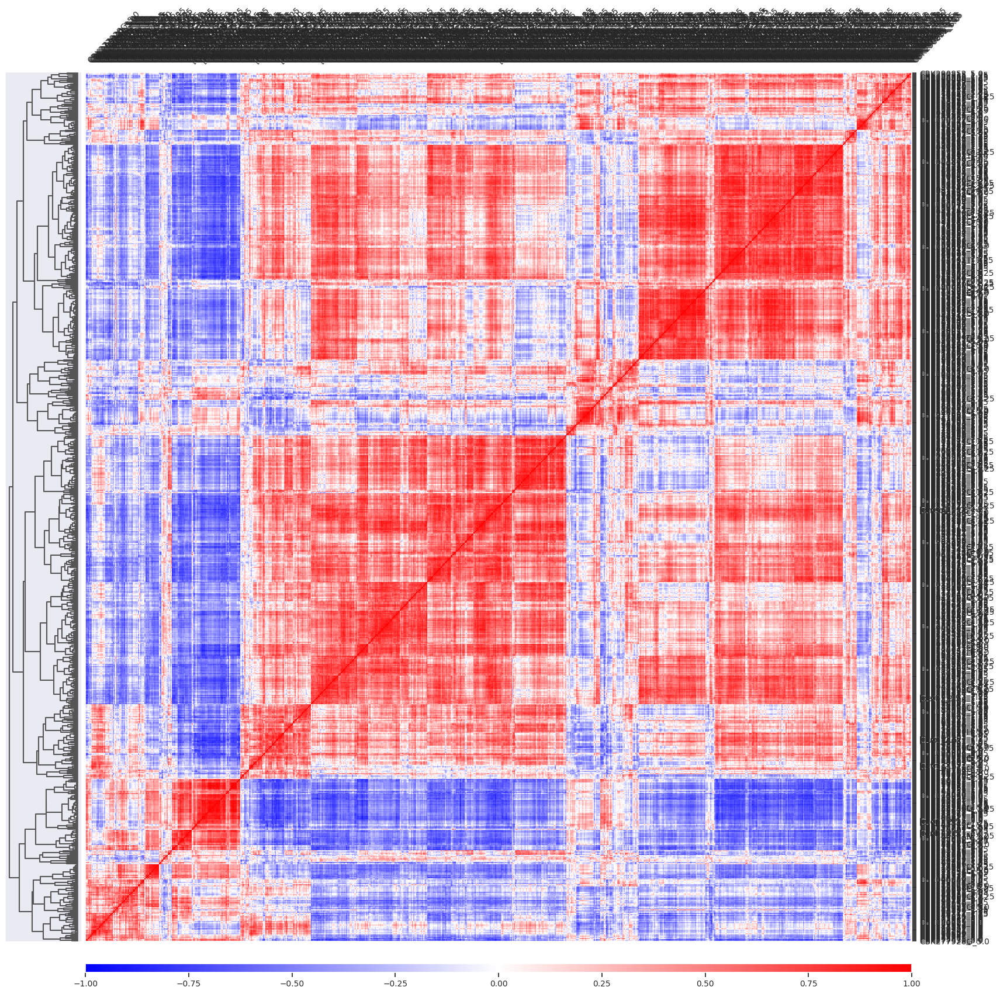

In [60]:
# Plot the correlation matrix
#sc.set_figure_params(scanpy=True, fontsize=18)
ax = sc.pl.correlation_matrix(adata, "ReplicateGroup", figsize=(20, 20))

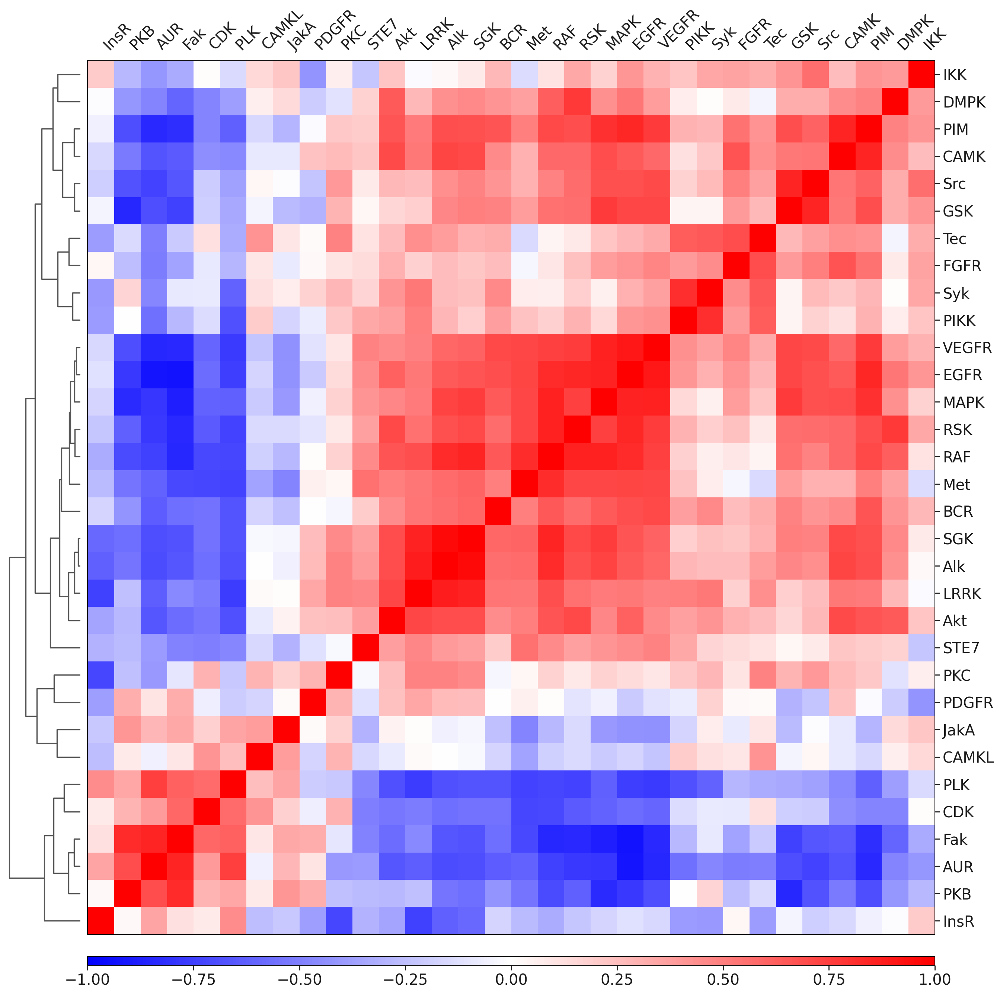

In [61]:
# Plot the correlation matrix
sc.set_figure_params(scanpy=True, fontsize=18)
ax = sc.pl.correlation_matrix(adata, "Family", figsize=(20, 20))

## TRY REMOVING LOW CONCENTRATION OF COMPOUNDS

### GRITS HIGHER THAN 1

In [62]:
df_grit_1


,grit,Count_nuclei,dose,compound
group,,,,
CBK277971C_5.0,0.990108,158.833333,5.00,CBK277971C
CBK277948_5.0,0.990276,188.882353,5.00,CBK277948
CBK290689_1.25,0.992404,183.777778,1.25,CBK290689
CBK288313_1.25,0.992856,154.611111,1.25,CBK288313
CBK041223_5.0,0.993980,135.111111,5.00,CBK041223
...,...,...,...,...
CBK288278_5.0,5.944757,56.722222,5.00,CBK288278
CBK277956_5.0,6.291641,84.111111,5.00,CBK277956
CBK288341_1.25,6.373289,110.500000,1.25,CBK288341


In [63]:
df_grit_1 = df_grit_1.reset_index(drop=True)
df_grit_1['ReplicateGroup'] = df_grit_1['compound'] + '_' + df_grit_1['dose'].astype(str) 
display(df_grit_1)

,grit,Count_nuclei,dose,compound,ReplicateGroup
0,0.990108,158.833333,5.00,CBK277971C,CBK277971C_5.0
1,0.990276,188.882353,5.00,CBK277948,CBK277948_5.0
2,0.992404,183.777778,1.25,CBK290689,CBK290689_1.25
3,0.992856,154.611111,1.25,CBK288313,CBK288313_1.25
4,0.993980,135.111111,5.00,CBK041223,CBK041223_5.0
...,...,...,...,...,...
516,5.944757,56.722222,5.00,CBK288278,CBK288278_5.0
517,6.291641,84.111111,5.00,CBK277956,CBK277956_5.0
518,6.373289,110.500000,1.25,CBK288341,CBK288341_1.25
519,6.433124,82.388889,5.00,CBK288341,CBK288341_5.0


In [69]:
U2OS_dfZscores

,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,AreaShape_Zernike_7_5_nuclei,AreaShape_Zernike_7_7_nuclei,AreaShape_Zernike_8_0_nuclei,AreaShape_Zernike_8_2_nuclei,AreaShape_Zernike_8_4_nuclei,AreaShape_Zernike_8_6_nuclei,AreaShape_Zernike_8_8_nuclei,AreaShape_Zernike_9_1_nuclei,...,RadialDistribution_ZernikePhase_illumPHAandWGA_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_9_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_1_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_2_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,Metadata_Barcode,Metadata_Well,Metadata_Site,Count_nuclei,compound_id,cmpd_conc,cmpd_name,Family,therapeutic_class_2023,ImageID,ReplicateGroup,Replicate
0,-2.299470,-3.014067,-2.172426,0.277843,-2.128036,0.334498,-2.141344,0.301081,-1.084642,-2.440732,-2.379966,-3.105904,3.419789,1.4

In [65]:
U2OS_dfZscores_1grit = U2OS_dfZscores.copy()
# Add a new column to df_U2OS, initialized to 0
U2OS_dfZscores_1grit['higher_than_one_grit'] = 0

# Count occurrences of each compound in df_Low_grit_1
U2OS_dfZscores_1grit['higher_than_one_grit'] = U2OS_dfZscores_1grit['ReplicateGroup'].apply(
    lambda x: (df_grit_1['ReplicateGroup'] == x).sum()
)

# Display the updated DataFrame
display(U2OS_dfZscores_1grit.head(2))

,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,AreaShape_Zernike_7_5_nuclei,AreaShape_Zernike_7_7_nuclei,AreaShape_Zernike_8_0_nuclei,AreaShape_Zernike_8_2_nuclei,AreaShape_Zernike_8_4_nuclei,AreaShape_Zernike_8_6_nuclei,AreaShape_Zernike_8_8_nuclei,AreaShape_Zernike_9_1_nuclei,...,RadialDistribution_ZernikePhase_illumPHAandWGA_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_9_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_1_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_2_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,Metadata_Barcode,Metadata_Well,Metadata_Site,Count_nuclei,compound_id,cmpd_conc,cmpd_name,Family,therapeutic_class_2023,ImageID,ReplicateGroup,Replicate,higher_than_one_grit
0,-2.299470,-3.014067,-2.172426,0.277843,-2.128036,0.334498,-2.141344,0.301081,-1.084642,-2.440732,-2.379966,-3.105904,3.419789,1.409809,-3.616612,-3.586692,-2.380383,-2.3

In [70]:
U2OS_dfZscores_1grit.higher_than_one_grit.unique()
# Count the number of rows where 'higher_than_one_grit' is 0
num_rows_with_zero = (U2OS_dfZscores_1grit['higher_than_one_grit'] == 0).sum()
print(f"Number of rows with 0 in 'higher_than_one_grit': {num_rows_with_zero}")

Number of rows with 0 in 'higher_than_one_grit': 5610


In [83]:
# Filter rows where 'higher_than_one_grit' is 1 or 'compound_id' is 'dmso'
filtered_df_g1 = U2OS_dfZscores_1grit[
    (U2OS_dfZscores_1grit['higher_than_one_grit'] == 1) | 
    (U2OS_dfZscores_1grit['compound_id'] == '[dmso]')
]

filtered_df_g1

,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,AreaShape_Zernike_7_5_nuclei,AreaShape_Zernike_7_7_nuclei,AreaShape_Zernike_8_0_nuclei,AreaShape_Zernike_8_2_nuclei,AreaShape_Zernike_8_4_nuclei,AreaShape_Zernike_8_6_nuclei,AreaShape_Zernike_8_8_nuclei,AreaShape_Zernike_9_1_nuclei,...,RadialDistribution_ZernikePhase_illumPHAandWGA_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_9_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_1_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_2_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,Metadata_Barcode,Metadata_Well,Metadata_Site,Count_nuclei,compound_id,cmpd_conc,cmpd_name,Family,therapeutic_class_2023,ImageID,ReplicateGroup,Replicate,higher_than_one_grit
0,-2.299470,-3.014067,-2.172426,0.277843,-2.128036,0.334498,-2.141344,0.301081,-1.084642,-2.440732,-2.379966,-3.105904,3.419789,1.409809,-3.616612,-3.586692,-2.380383,-2.3

In [90]:
filtered_df_g1.to_csv('/home/jovyan/share/data/analyses/sofia/kinase378-vt1/CellProfiler/U2OS/U2OS_filtered_df_g1.csv', sep=';', index=False)

In [86]:
import scanpy as sc
# Load the features data
features_df = filtered_df_g1

# Separate feature data and metadata
num_metadata_cols = 13
feature_data_df = features_df.iloc[:, :-num_metadata_cols]  # All columns except the last 11
metadata_df = features_df.iloc[:, -num_metadata_cols:]      # Last 11 columns (metadata)

# Ensure that metadata has the same row indices as feature data
if not feature_data_df.index.equals(metadata_df.index):
    raise ValueError("The indices of feature data and metadata do not match.")

import scanpy as sc

# Create AnnData object with feature data
adata_filtered = sc.AnnData(X=feature_data_df,obs=metadata_df)

print(adata_filtered)

AnnData object with n_obs × n_vars = 10893 × 1728
    obs: 'Metadata_Barcode', 'Metadata_Well', 'Metadata_Site', 'Count_nuclei', 'compound_id', 'cmpd_conc', 'cmpd_name', 'Family', 'therapeutic_class_2023', 'ImageID', 'ReplicateGroup', 'Replicate', 'higher_than_one_grit'


/usr/local/lib/python3.10/dist-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


/usr/local/lib/python3.10/dist-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 1728 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


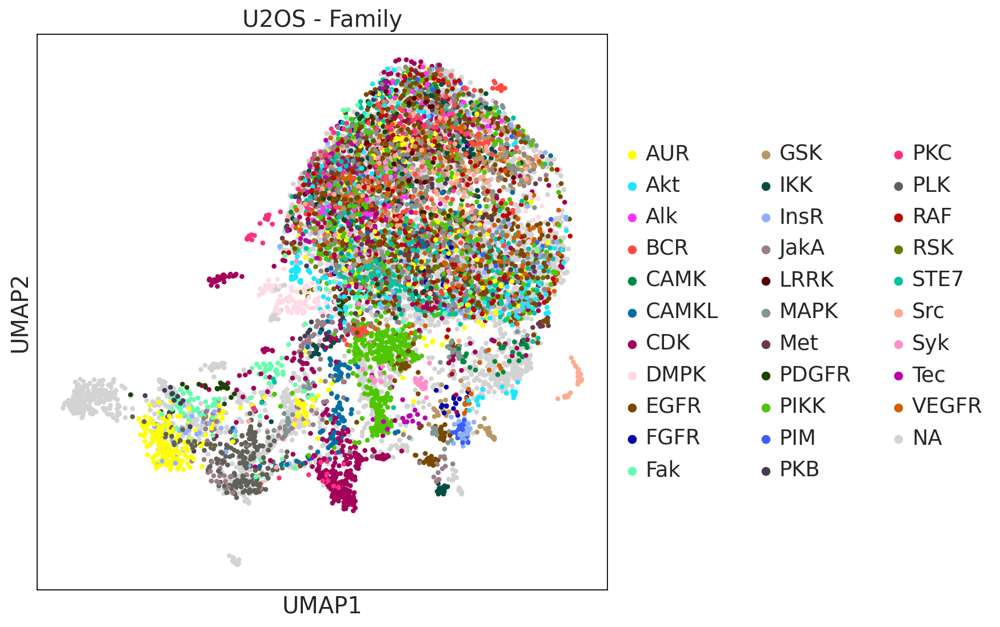

In [87]:
# Compute UMAP
sc.pp.neighbors(adata_filtered)  # This computes the neighborhood graph
sc.tl.umap(adata_filtered)       # This computes the UMAP coordinates

# Set the figure size
#plt.figure(figsize=(30, 20))  # Adjust the size if needed
sc.tl.umap(adata_filtered)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_facecolor('white')  # Set background color to light gray (or any color you prefer)

sc.pl.umap(
    adata_filtered,
    #color='Metadata_Barcode',                  # Replace with actual metadata column name
    color='Family',                  # Replace with actual metadata column name
    title='U2OS - Family',         # Plot title
    ax=ax,
    size=60,                          # Size of points)
)

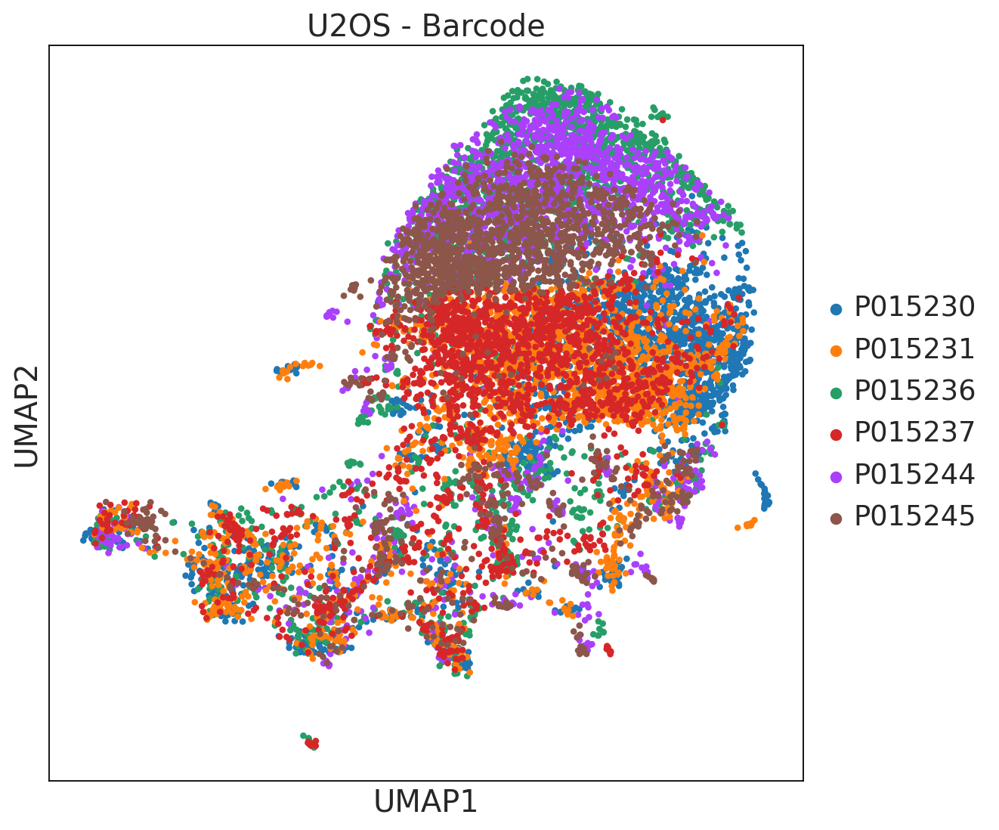

In [88]:
# Compute UMAP
sc.pp.neighbors(adata_filtered)  # This computes the neighborhood graph
sc.tl.umap(adata_filtered)       # This computes the UMAP coordinates

# Set the figure size
#plt.figure(figsize=(30, 20))  # Adjust the size if needed
sc.tl.umap(adata_filtered)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_facecolor('white')  # Set background color to light gray (or any color you prefer)

sc.pl.umap(
    adata_filtered,
    color='Metadata_Barcode',                  # Replace with actual metadata column name
    #color='Family',                  # Replace with actual metadata column name
    title='U2OS - Barcode',         # Plot title
    ax=ax,
    size=60,                          # Size of points)
)

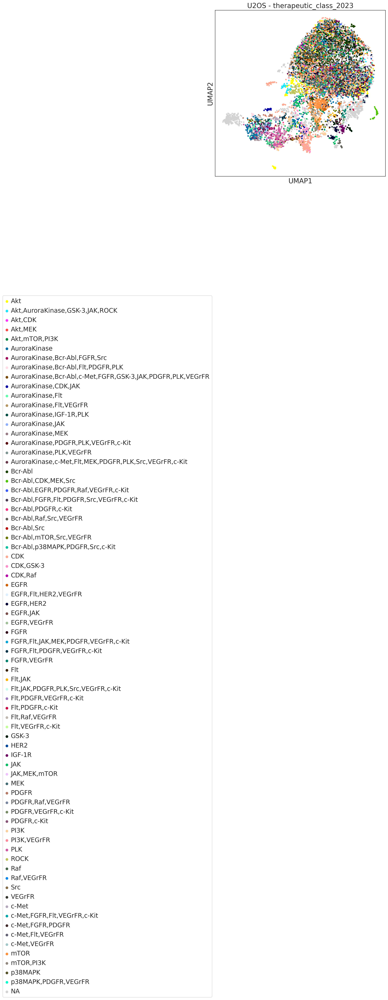

In [94]:
import scanpy as sc
import matplotlib.pyplot as plt

# Assuming adata_filtered is already defined and preprocessed
sc.pp.neighbors(adata_filtered)  # Computes the neighborhood graph
sc.tl.umap(adata_filtered)       # Computes the UMAP coordinates

# Create the UMAP plot
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_facecolor('white')  # Set background color to white

# Create UMAP plot and save the figure
sc.pl.umap(
    adata_filtered,
    color='therapeutic_class_2023',  # Replace with actual metadata column name
    title='U2OS - therapeutic_class_2023',  # Plot title
    ax=ax,
    size=60,  # Size of points
    show=False  # Don't show the plot yet
)

# Now modify the legend if it exists
if ax.get_legend() is not None:
    ax.legend().set_bbox_to_anchor((0.0, -0.7))

# Finally, display the plot
plt.show()

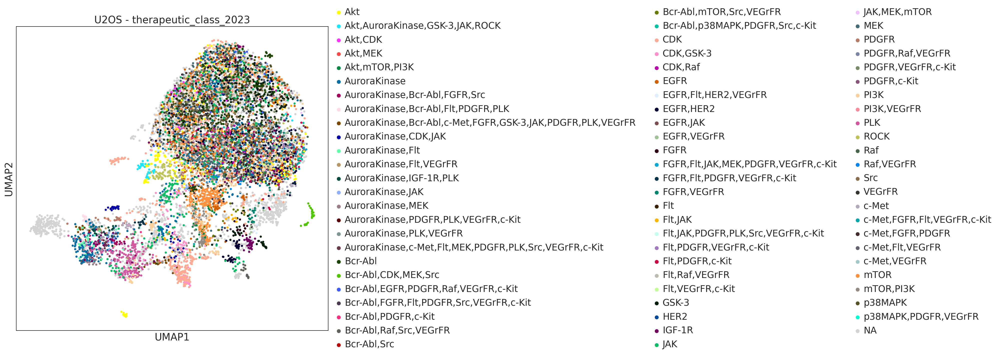

In [103]:
import scanpy as sc
import matplotlib.pyplot as plt

# Assuming adata_filtered is already defined and preprocessed
sc.pp.neighbors(adata_filtered)  # Computes the neighborhood graph
sc.tl.umap(adata_filtered)       # Computes the UMAP coordinates

# Create the UMAP plot
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_facecolor('white')  # Set background color to white

# Create UMAP plot and save the figure
sc.pl.umap(
    adata_filtered,
    color='therapeutic_class_2023',  # Replace with actual metadata column name
    title='U2OS - therapeutic_class_2023',  # Plot title
    ax=ax,
    size=60,  # Size of points
    show=False  # Don't show the plot yet
)

# # Now modify the legend if it exists
# if ax.get_legend() is not None:
#     ax.legend(ncol=4, loc='upper center', bbox_to_anchor=(0.5, -0.1), fontsize='small')  # Position below the plot

# # Adjust layout to prevent overlap
# plt.tight_layout()

# Finally, display the plot
plt.show()

### this was the last change 4 nov